# Telstra Network Disruption
----------------------------------------------------------------------------

Ing. Rafael Oliva



### Introduccion

###  Business Understanding

El objetivo de este problema es poder predecir en la red de TELSTRA la severidad de la falla en un momento dado en una ubicacion en particular con una "llave" (id key). Estas predicciones son basadas en los datos disponibles en nuestros archivos. 

En esta situacion, se categorizo la severidad de las fallas en tres categorias;
- 0 (No hay falla)
- 1 (Pocas fallas)
- 2 (Multiples fallas)


Asi que, dado el problema proporsionado por TELSTRA, debemos de plantearnos las siguientes preguntas:
- La severidad de las fallas atravez de la red, estan directamente relacionadas con la ubicacion?
- Se podra predecir la ubicacion de la falla dada la base de datos proporcionada?
- Como podemos medir nuestro valor de exito dentro del proyecto? 



### Data Understanding

El conjunto de datos fue creado a partir de 6 reportes de tipos de fallas severidad de fallas y mas. Estos reportes representan el historial mas reciente de fallas y la ubicacion de las mismas alrededor de la red de comunicacion de la empresa Telstra. Para poder avanzar en la creacion de modelos de prediccion primero se debe determinar que caracteristicas son las mas relevantes en todo este conjuto de informacion proporcionada. Para ello realizaremos una analisis exploratorio de datos inicial. Esto es para tener un inicio para el plantamiento de la hipotesis inicial. 

Ahora preprocesaremos los datos donde lograremos tener una mejor idea de la calidad de datos que se tiene y el tipo de datos con que se trabajara

In [1]:
%matplotlib inline

#Seccion de importacion de librerias utilizadas en el transcurso del proyecto


import numpy as np
import pandas as pd
import os
import seaborn as sns

import matplotlib.pyplot as plt

plt.rcParams['figure.dpi']= 300
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from catboost import CatBoostClassifier, Pool

sns.set_style("whitegrid")
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')


In [2]:
#------------------Cargando conjuto de datos------------------

datadir = 'data'
def str_to_num(string):
    return int(string.split(" ")[1])    #after the split returns the num on the string

#loading test.csv file
test = pd.read_csv('test.csv', 
                   converters = {'location':str_to_num})

#loading train.csv file
train = pd.read_csv('train.csv',
                   converters = {'location':str_to_num})

#loading event_type.csv file
event_type = pd.read_csv('event_type.csv', 
                         converters = {'event_type':str_to_num})

#loading log_feature.csv file
log_failure = pd.read_csv('log_feature.csv', 
                          converters = {'log_feature':str_to_num})

#loading resource_type.csv file
resource_type = pd.read_csv('resource_type.csv', 
                            converters = {'resource_type':str_to_num})

#loading severity_type.csv file
severity_type = pd.read_csv('severity_type.csv', 
                            index_col = 'id',
                            converters = {'severity_type':str_to_num})

df = train.append(test)

#------------------Printing the shape of each data set------------------
print("The size of the test data set is: {}\n".format(test.shape))
print("The size of the train data set is: {}\n".format(train.shape))
print("The size of the events data set is: {}\n".format(event_type.shape))
print("The size of the log feautures data set is: {}\n".format(log_failure.shape))
print("The size of the resource data set is: {}\n".format(resource_type.shape))
print("The size of the severity type data set is: {}\n".format(severity_type.shape))

print("Headers of train data set")
train.head()



The size of the test data set is: (11171, 2)

The size of the train data set is: (7381, 3)

The size of the events data set is: (31170, 2)

The size of the log feautures data set is: (58671, 3)

The size of the resource data set is: (21076, 2)

The size of the severity type data set is: (18552, 1)

Headers of train data set


,id,location,fault_severity
0,14121,118,1
1,9320,91,0
2,14394,152,1
3,8218,931,1
4,14804,120,0


In [3]:
#Revisando los headers del conjunto de datos de test
print("Headers of test data set")
test.head()

Headers of test data set


,id,location
0,11066,481
1,18000,962
2,16964,491
3,4795,532
4,3392,600


Uniremos los conjuntos de datos a excepcion de test.csv para poder procesarlos en conjunto y tenerlos en una sola tabla.

In [4]:
train_1 = train.merge(severity_type, how = 'left', left_on='id', right_on='id')
train_2 = train_1.merge(resource_type, how = 'left', left_on='id', right_on='id')
train_3 = train_2.merge(log_failure, how = 'left', left_on='id', right_on='id')
train_4 = train_3.merge(event_type, how = 'left', left_on='id', right_on='id')
#checking the head after merging

print("The size of the train dataset is: {} ".format(train_4.shape))

print("Deleting duplicates in data set...")
train_4.drop_duplicates(subset= 'id', keep= 'first', inplace = True)

#checking the shape of training file after dropping duplicate records
print("The size of the train dataset is now: {} ".format(train_4.shape))
train_4.head()

The size of the train dataset is: (61839, 8) 
Deleting duplicates in data set...
The size of the train dataset is now: (7381, 8) 


,id,location,fault_severity,severity_type,resource_type,log_feature,volume,event_type
0,14121,118,1,2,2,312,19,34
4,9320,91,0,2,2,315,200,34
8,14394,152,1,2,2,221,1,35
12,8218,931,1,1,8,80,9,15
18,14804,120,0,1,2,134,1,34


Ahora que ya tenemos todos nuestros datos en un solo lugar, podemos iniciar visualizando nuestros datos para ver, tentativamente, las tendencias del comportamiento de los mismos.

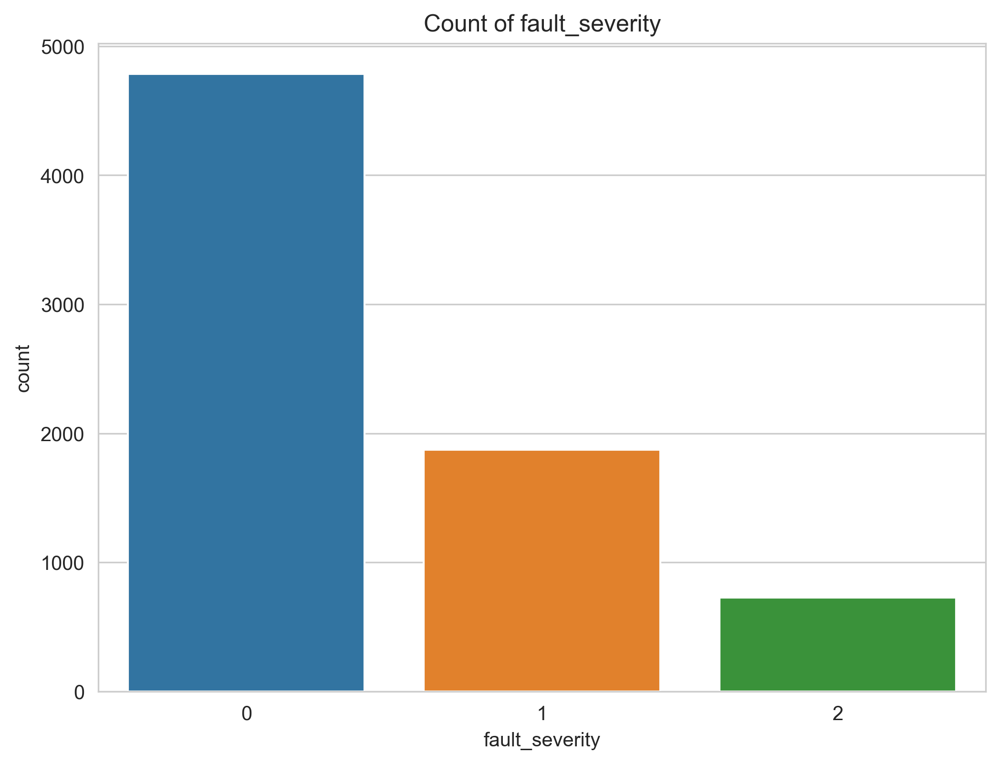

In [5]:
#Ilustrando la cantidad de fallas en train dataset de cada tipo


plt.figure(figsize = (8,6))
ax = sns.countplot(train_4['fault_severity'])
#ax.bar_label(ax.containers[0])
plt.title("Count of fault_severity")
plt.show()

Este conjuto de datos, nos permite ver que, como lo esperado en la red de comunicacion de TELSTRA, la mayoria de localidades no tienen falla alguna. Pero si se tiene un numero alarmante de fallas y localidades que se tienen numerosas fallas. 

Ahorita utilizaremos una matriz de correlacion. Esto nos servira en poder visualizar y ver puntualmente, si existen relaciones y sobre que relaciones existen.

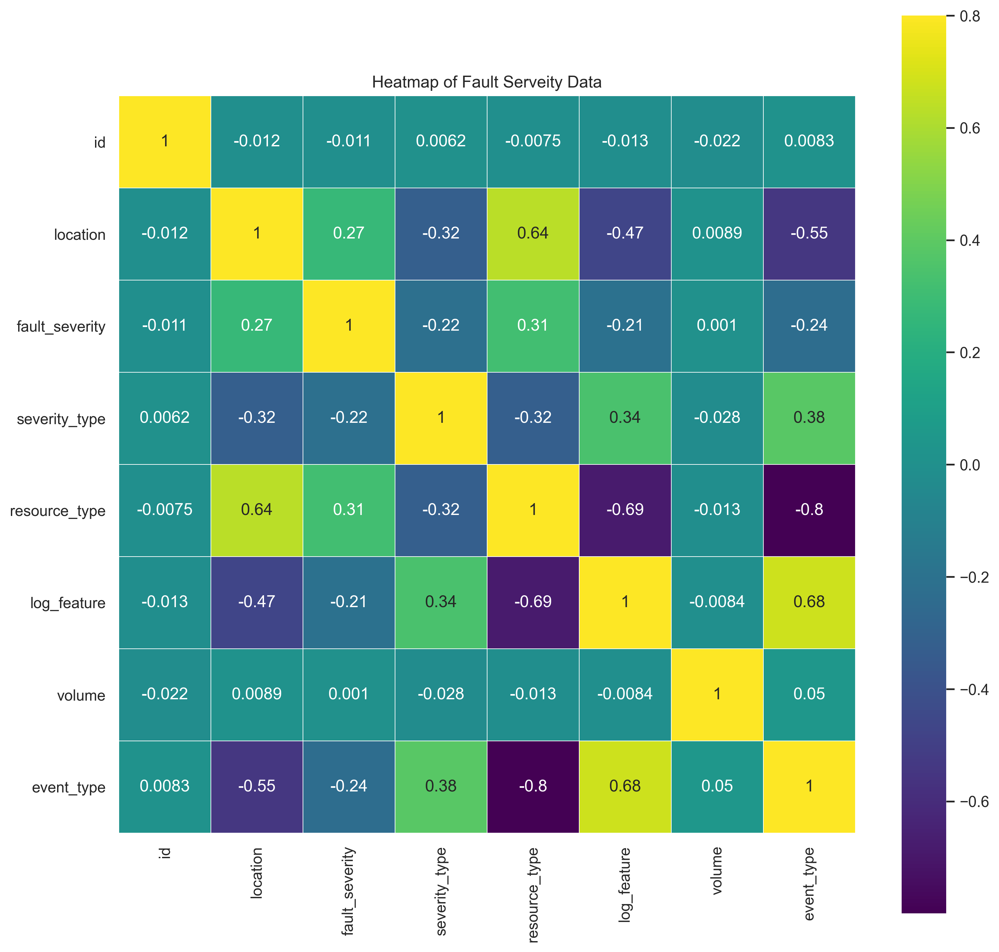

In [6]:
#Plotting a heat map of the fault severity

plt.figure(figsize = (12,12))
sns.set()
sns.heatmap(train_4.corr(), 
            vmax = 0.8, 
            linewidths= 0.01, 
            square= True, annot= True, 
            cmap= 'viridis', 
            linecolor= 'white')
plt.title("Heatmap of Fault Serveity Data")
plt.show()

En la grafica de calor (heatmap), podemos observar los indices de correlacion entre cada una de las variables. Donde 1 es que son directamente proporcionales; es decir, si uno incrementa, el otro igual incrementa. Y donde -1 es que las variables son inversamente proporcionales.

Ahora bien, se denota a simple vista unas relaciones claves conforme a la ubicaion para nuestro analisis:
- Location v fault_severity
- location v severity_type

Ahora, despues de nuestra matriz de correlacion procederemos a investigar visualmente un poco mas sobre la relevancia que tiene la ubicacion sobre el tipo de fallas que se encuentran. Para ello, utilizaremos una grafica de dispersion para visualizar la ubicacion de cada falla respecto a la informacion que se tiene. 


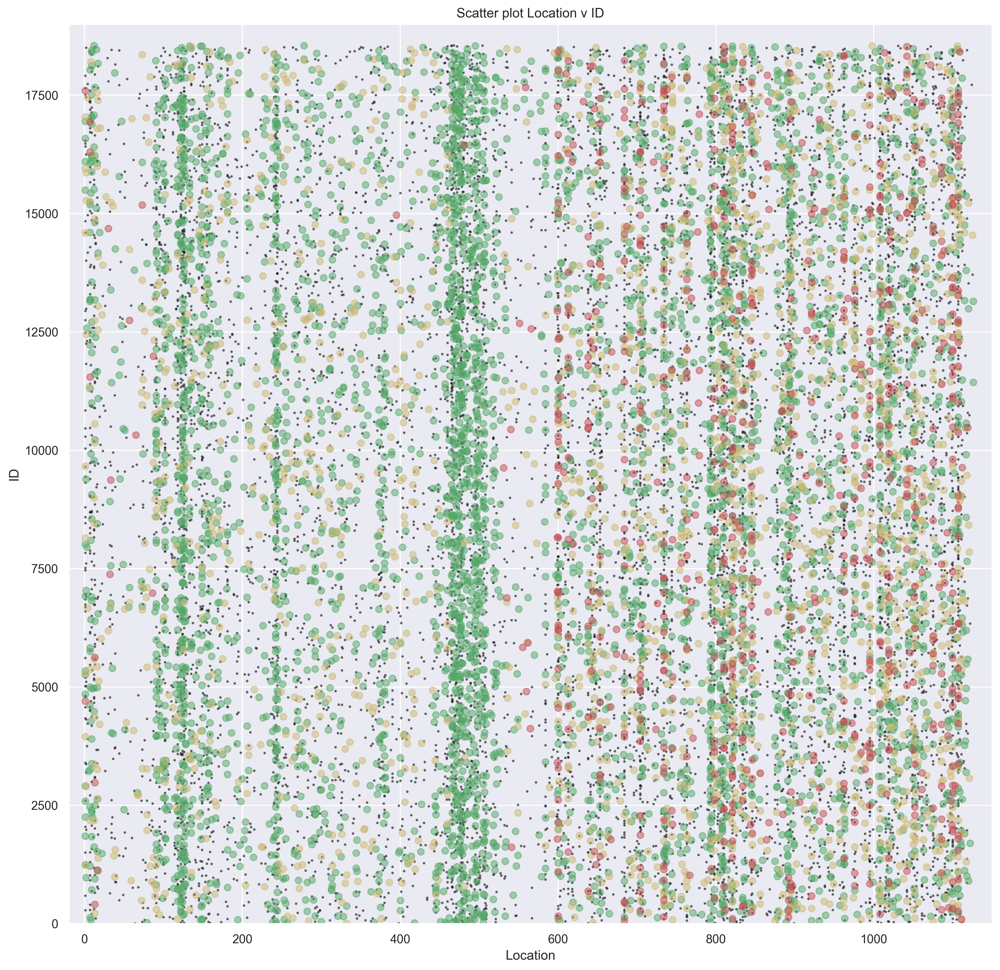

In [7]:
#--------------------------------------------------------------------------
#loading test.csv file
test_plot = pd.read_csv('test.csv', 
                        index_col = 'id',
                        converters = {'location':str_to_num})

#loading train.csv file
train_plot = pd.read_csv('train.csv',
                         index_col = 'id',
                         converters = {'location':str_to_num})

df = train_plot.append(test_plot)

#--------------------------------------------------------------------------

fig, ax = plt.subplots(figsize=(15,15))
plt.title("Scatter plot Location v ID")
ax.scatter(df.loc[df.fault_severity.isnull(),'location'],
           df.loc[df.fault_severity.isnull()].index,
           alpha=0.5,
           color='k',
           s=2)

ax.scatter(df.loc[df.fault_severity==0,'location'],
           df.loc[df.fault_severity==0].index,
           alpha=0.5,
           color='g')

ax.scatter(df.loc[df.fault_severity==1,'location'],
           df.loc[df.fault_severity==1].index,
           alpha=0.5,
           color='y')

ax.scatter(df.loc[df.fault_severity==2,'location'],
           df.loc[df.fault_severity==2].index,
           alpha=0.5,
           color='r')

ax.set_xlim((-20,1150))
ax.set_ylim((0,19000))
ax.set_xlabel('Location')
ax.set_ylabel('ID');




Ya vista la grafica de dispersion, podemos notar una tendencia. Entre mayor sea el numero de la ubicacion, las fallas se hacen mas propensas y aumentan su severidad. Se puede asumir que, entre mayor sea el numero de la ubicacion, esta se encontra mas lejos. Y que por igual, que cada uno de las ubicaciones, dependiendo de su numero, se encuentran en orden y en cercania relativa al valor dado. A partir de ello, podemos plantear una hipotesis con nuestra matriz de correlacion; La severidad y cantidad de las fallas en la red de TELSTRA sera directamente proporcional a la ubicacion y distancia que estas tengan. 

## Modeling
Debido a la naturalidad categorica de nuestro complejo de datos, es necesario, ya sea, procesar profundamente nuestro set de datos o utilizar un algoritmo de machine learning capaz de poder procesar esta informacion. Dado esto, se propuso utilizar el algoritmo open-source llamado "CatBoost". El cual es un algoritmo bastante versatil y flexible. Donde tiene la capacidad de manejar una gran variedad de tipo de datos sin ningun problema proveyendo soluciones fuera de lo convencional para apoyar con los problemas dados comunmente en el analisis de negocios y big data. 

El objetivo ahora sera desplegar el algoritmo CatBoost de forma correcta. Para ello, nececitamos iniciar con el entrenamiento supervisado del complejo de datos ya procesado. Con ello utilizaremos el complejo de datos "train" donde utilizaremos el 75% de sus datos para entrenar al algoritmo y el 25% seran utilizados para validar el entrenamiento y simular a su vez como este se comportara si es dado un set de datos no antes vistos. 


In [8]:
#Splitting X(data in array) and y (index of data used)

X = train_4[['id', 'location', 'severity_type', 'resource_type',
       'log_feature', 'volume', 'event_type']]
y = train_4.fault_severity
 
#divide the training set into train/validation set with 25% set aside for validation. 

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=101)

Ahora, actualizaremos los parametros del algoritmo para poder hacer uso de la naturaleza categorica del mismo y utilizarlo en su mejor capacidad para mejores resultados.

In [9]:
categorical_features_indices = np.where(X_train.dtypes == object)[0]

In [10]:
#using pool to make the training and validation sets
train_dataset = Pool(data=X_train,
                     label=y_train,
                     cat_features=categorical_features_indices)

eval_dataset = Pool(data=X_test,
                    label=y_test,
                    cat_features=categorical_features_indices)
 
#initialize the catboost classifier
model = CatBoostClassifier(iterations=1000,
                           learning_rate=1,
                           depth=2,
                           loss_function='MultiClass',
                           random_seed=3,
                           bagging_temperature=22,
                           od_type='Iter',
                           metric_period=50,
                           od_wait=100)
#Fit model

model.fit(train_dataset, eval_set= eval_dataset, plot= True)




MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8097011	test: 0.8232279	best: 0.8232279 (0)	total: 57.5ms	remaining: 57.4s
50:	learn: 0.6891822	test: 0.7014301	best: 0.7011246 (48)	total: 223ms	remaining: 4.16s
100:	learn: 0.6651755	test: 0.6883462	best: 0.6883462 (100)	total: 409ms	remaining: 3.64s
150:	learn: 0.6478698	test: 0.6820732	best: 0.6796182 (146)	total: 565ms	remaining: 3.18s
200:	learn: 0.6357514	test: 0.6749089	best: 0.6735488 (193)	total: 718ms	remaining: 2.85s
250:	learn: 0.6246436	test: 0.6744368	best: 0.6735488 (193)	total: 876ms	remaining: 2.61s
300:	learn: 0.6168495	test: 0.6715840	best: 0.6712311 (299)	total: 1.06s	remaining: 2.46s
350:	learn: 0.6057613	test: 0.6733312	best: 0.6697978 (332)	total: 1.22s	remaining: 2.26s
400:	learn: 0.5983205	test: 0.6720923	best: 0.6697978 (332)	total: 1.38s	remaining: 2.07s
Stopped by overfitting detector  (100 iterations wait)

bestTest = 0.6697978062
bestIteration = 332

Shrink model to first 333 iterations.


Incialmente, a nuestro modelo, se le indico que entrenara con 1000 iteraciones. Pero luego de 400 iteraciones, como marca arriba, este tuvo overfitting. Por lo cual, recorto el modelo a solo 333 iteraciones.

Ahora que tenemos nuestro modelo ya entrenado, utilizaremos la funcion predict() para poder predecir los valores con el conjunto de datos de validacion que en este caso, sera el 25% de valores de nuestro train.csv Mientras que nuestra funcion predict_proba() nos dara la probabilidad de cada uno de los puntos dados.

In [37]:
X.head()

,id,location,severity_type,resource_type,log_feature,volume,event_type
0,14121,118,2,2,312,19,34
4,9320,91,2,2,315,200,34
8,14394,152,2,2,221,1,35
12,8218,931,1,8,80,9,15
18,14804,120,1,2,134,1,34


In [11]:
#predicts the actual label or class over the evaluation data set (gives us the final choice)
preds_class = model.predict(eval_dataset) 
print('---------------------------------------------')
print('Predicted Labels')
print(preds_class)


#get predicted probabilities for each class (gives us the probabilities of each choice option that it had)
preds_proba = model.predict_proba(eval_dataset)
print('---------------------------------------------')
print('Probabilities of each Label')
print(preds_proba)

---------------------------------------------
Predicted Labels
[[0]
 [0]
 [2]
 ...
 [2]
 [0]
 [0]]
---------------------------------------------
Probabilities of each Label
[[6.34695909e-01 3.42714092e-01 2.25899984e-02]
 [8.30100770e-01 1.42077653e-01 2.78215777e-02]
 [4.01349383e-01 1.49938543e-01 4.48712074e-01]
 ...
 [3.20211371e-01 8.93100493e-02 5.90478580e-01]
 [9.06275128e-01 9.34559188e-02 2.68953024e-04]
 [3.85959137e-01 2.72217943e-01 3.41822920e-01]]


Ya que tenemos nuestro modelo entrenado y evaluado, es hora de implementar este a nuestro archivo test.cvs. Esto para poder predecir la severidad de las fallas dependiendo de la ubicacion. Crearemos nuestro conjunto de datos de test.csv


In [12]:
print("The shape of the test data set without merging is: {}".format(test.shape))

test_1 = test.merge(severity_type, how = 'left', left_on='id', right_on='id')
test_2 = test_1.merge(resource_type, how = 'left', left_on='id', right_on='id')
test_3 = test_2.merge(log_failure, how = 'left', left_on='id', right_on='id')
test_4 = test_3.merge(event_type, how = 'left', left_on='id', right_on='id')

#removing the duplicates.
test_4.drop_duplicates(subset= 'id', keep= 'first', inplace = True)
 
#checking for any null values. 
test_4.isnull().sum()

print("The shape of the merged test dataset is: {}".format(test_4.shape))

The shape of the test data set without merging is: (11171, 2)
The shape of the merged test dataset is: (11171, 7)


Ahora utilizaremos el modelo en el nuevo conjunto de datos para poder predecir la severidad de fallas y en donde estas sucederan.


In [13]:
predict_class = model.predict(test_4)
print('---------------------------------------------')
print('Predicted Labels for Test')
print(predict_class)

prediction_class_df = pd.DataFrame(predict_class, 
                                   columns = ['fault_severity'])

prediction_catboost = pd.concat([test[['id','location']], prediction_class_df],axis = 1)
prediction_catboost.to_csv('prediction.csv', index = False, header = True)
print(prediction_catboost.head(15))

predict_test = model.predict_proba(test_4) #using the trained catboost model to get the probabilities of the choices
print(predict_test)
print("The shape of the prediction test dataset is now: {}".format(predict_test.shape))


pred_df = pd.DataFrame(predict_test, 
                       columns = ['predict_0','predict_1', 'predict_2'])
print(pred_df)
print("The shape of the prediction data frame is now: {}".format(pred_df.shape))


submission_cat = pd.concat([test[['id']],pred_df],axis=1)
submission_cat.to_csv('sub_cat_1.csv',index=False,header=True)
submission_cat.head(15)


---------------------------------------------
Predicted Labels for Test
[[0]
 [2]
 [0]
 ...
 [0]
 [0]
 [0]]
       id  location  fault_severity
0   11066       481               0
1   18000       962               2
2   16964       491               0
3    4795       532               0
4    3392       600               0
5    3795       794               0
6    2881       375               0
7    1903       638               0
8    5245       690               0
9    6726       893               0
10   1311       418               0
11  15795       320               0
12   4315      1013               0
13   3393       931               0
14   6764       707               0
[[9.94027635e-01 4.51649513e-03 1.45587024e-03]
 [3.21017457e-01 1.74778179e-01 5.04204364e-01]
 [9.86801241e-01 1.06051421e-02 2.59361665e-03]
 ...
 [5.10674029e-01 3.61005197e-01 1.28320773e-01]
 [9.03046332e-01 9.69435106e-02 1.01571331e-05]
 [7.46159899e-01 2.37369803e-01 1.64702982e-02]]
The shape of the predi

,id,predict_0,predict_1,predict_2
0,11066,0.994028,0.004516,0.001456
1,18000,0.321017,0.174778,0.504204
2,16964,0.986801,0.010605,0.002594
3,4795,0.851619,0.147910,0.000471
4,3392,0.632463,0.145794,0.221744
5,3795,0.563807,0.390033,0.046161
6,2881,0.797273,0.202510,0.000216
7,1903,0.615593,0.061395,0.323012
8,5245,0.737178,0.238249,0.024573
9,6726,0.870761,0.129025,0.000214


## Evaluation

Apartir del archivo creado se subio a kaggle para obtener una puntuacion para la evaluacion requerida solo para terminos de esta activad. En este caso el resultado con nuestro modelo con el algoritmo CatBoost fue el siguiente:

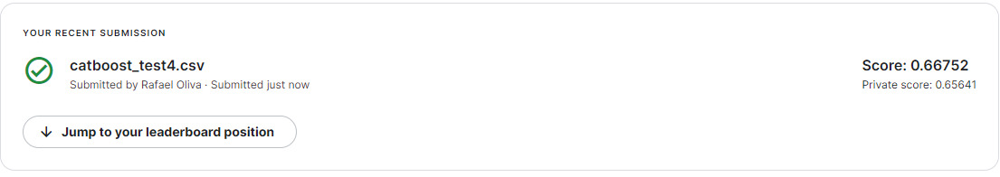

Luego de esto podemos visualizar los resultados finales en la grafica de dispersion donde se puede apreciar los datos resultantes del archivo generado en csv. 

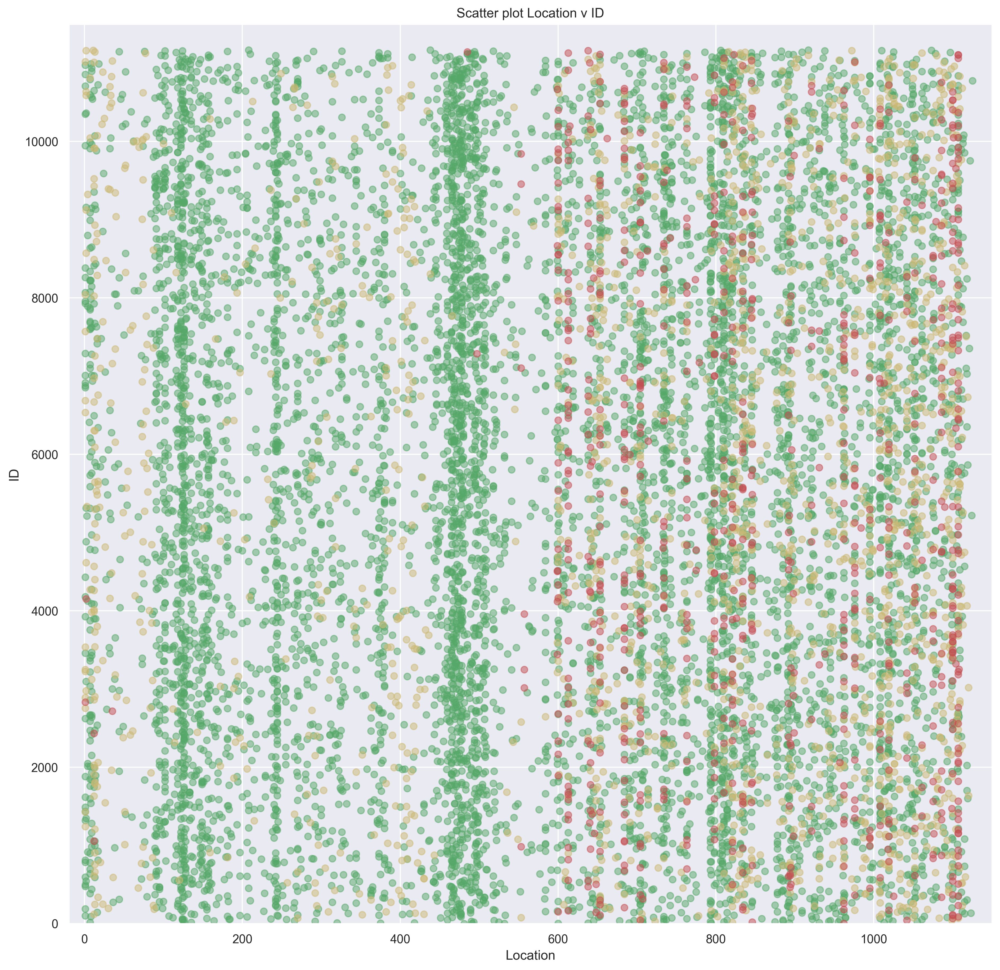

In [20]:
#loading test.csv file
prediction_plot = pd.read_csv('prediction.csv', 
                        index_col = 'id')

fig, ax = plt.subplots(figsize=(15,15))
plt.title("Scatter plot Location v ID")
ax.scatter(prediction_catboost.loc[prediction_catboost.fault_severity.isnull(),'location'],
           prediction_catboost.loc[prediction_catboost.fault_severity.isnull()].index,
           alpha=0.5,
           color='k',
           s=2)

ax.scatter(prediction_catboost.loc[prediction_catboost.fault_severity==0,'location'],
           prediction_catboost.loc[prediction_catboost.fault_severity==0].index,
           alpha=0.5,
           color='g')

ax.scatter(prediction_catboost.loc[prediction_catboost.fault_severity==1,'location'],
           prediction_catboost.loc[prediction_catboost.fault_severity==1].index,
           alpha=0.5,
           color='y')

ax.scatter(prediction_catboost.loc[prediction_catboost.fault_severity==2,'location'],
           prediction_catboost.loc[prediction_catboost.fault_severity==2].index,
           alpha=0.5,
           color='r')

ax.set_xlim((-20,1150))
ax.set_ylim((0,11500))
ax.set_xlabel('Location')
ax.set_ylabel('ID');

In [39]:
model.get_feature_importance()

array([ 6.3250055 , 22.46957826, 11.11821714, 12.5966741 , 16.14897793,
       21.25928377, 10.08226331])

In [40]:
feature_importance = [t for t in zip(features = ['id', 
                                                 'location', 
                                                 'severity_type',
                                                 'resource_type', 
                                                 'log_feature',
                                                 'volume', 
                                                 'event_type'], 
                                     model.get_feature_importance())]

feature_importance_df = pd.DataFrame(feature_importance, 
                                     columns = ['Feature', 'VarImp'])

feature_importance_df = feature_importance_df.sort_values('VarImp', 
                                                          ascending = False)

SyntaxError: positional argument follows keyword argument (<ipython-input-40-a10bd0be434a>, line 8)